In [1]:
import numpy as np
import ConfigParser
from matplotlib import pyplot as plt
#Keras
from keras.models import model_from_json
from keras.models import Model
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, UpSampling2D, Reshape, core, Dropout
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization, Convolution2D, MaxPooling2D, ZeroPadding2D, Input, Embedding, LSTM, merge, Lambda, UpSampling2D, Deconvolution2D, Cropping2D
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
from keras.utils.vis_utils import plot_model as plot
from keras.optimizers import SGD


#scikit learn
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import jaccard_similarity_score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import sys
sys.path.insert(0, './lib/')
# help_functions.py
from help_functions import *
# extract_patches.py
from extract_patches import *
from extract_patches import recompone
from extract_patches import recompone_overlap
from extract_patches import paint_border
from extract_patches import kill_border
from extract_patches import pred_only_FOV
from extract_patches import get_data_testing
from extract_patches import get_data_testing_overlap
# pre_processing.py
from help_functions import *
from pre_processing import *
from extract_patches import *
from mask_retina import *
from model import *
from dual_IDG import *

Using TensorFlow backend.


In [2]:
# Load data
path_data = "DISC/"

create_new_train_test = False
trim = True

if create_new_train_test == True:
    raw_img = load_hdf5("DISC/total_raw.hdf5")
    mask_img = load_hdf5("DISC/total_mask.hdf5")
    raw_train, raw_test, mask_train, mask_test = train_test_split(raw_img, mask_img, test_size = 0.2, random_state = 123)
    write_hdf5(raw_train, "DISC/raw_train.hdf5")
    write_hdf5(raw_test, "DISC/raw_test.hdf5")
    write_hdf5(mask_train, "DISC/mask_train.hdf5")
    write_hdf5(mask_test, "DISC/mask_test.hdf5")
else:
    raw_train = load_hdf5("DISC/raw_train.hdf5")
    raw_test =  load_hdf5("DISC/raw_test.hdf5")
    mask_train = load_hdf5("DISC/mask_train.hdf5")
    mask_test = load_hdf5("DISC/mask_test.hdf5")
    
if trim == True:
    raw_train = raw_train[:,:,:,80:560]
    mask_train = mask_train[:,:,:,80:560]

In [3]:
raw_train.shape

(73, 3, 480, 480)

In [13]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, random_state=123, shuffle=True)


5

In [14]:
for train_index, val_index in kf.split(raw_train):
    print((train_index))
    print((val_index))

[ 0  1  2  3  5  6  7 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 39 40 41 43 44 45 46 47 48 49 50 54 55
 56 57 60 61 62 64 66 67 69 70]
[ 4  8  9 23 42 51 52 53 58 59 63 65 68 71 72]
[ 0  2  3  4  5  7  8  9 10 11 12 13 15 17 18 20 21 22 23 25 27 28 30 32
 33 34 35 36 38 39 40 41 42 45 46 47 48 49 50 51 52 53 55 57 58 59 60 61
 62 63 64 65 66 67 68 69 71 72]
[ 1  6 14 16 19 24 26 29 31 37 43 44 54 56 70]
[ 1  2  3  4  6  7  8  9 14 16 17 19 20 21 23 24 25 26 27 28 29 30 31 32
 33 34 35 36 37 38 39 41 42 43 44 46 47 48 49 51 52 53 54 55 56 57 58 59
 60 61 63 65 66 68 69 70 71 72]
[ 0  5 10 11 12 13 15 18 22 40 45 50 62 64 67]
[ 0  1  2  3  4  5  6  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24 25
 26 29 31 32 36 37 39 40 42 43 44 45 46 47 49 50 51 52 53 54 55 56 57 58
 59 62 63 64 65 66 67 68 70 71 72]
[ 7 21 27 28 30 33 34 35 38 41 48 60 61 69]
[ 0  1  4  5  6  7  8  9 10 11 12 13 14 15 16 18 19 21 22 23 24 26 27 28
 29 30 31 33 34 35 37 38 40

In [5]:
raw_img = load_hdf5("DISC/total_raw.hdf5")
mask_img = load_hdf5("DISC/total_mask.hdf5")

In [7]:
raw_normal = load_hdf5("DISC/normal_raw_img.hdf5")
raw_preplus = load_hdf5("DISC/pre-plus_raw_img.hdf5")
raw_plus = load_hdf5("DISC/plus_raw_img.hdf5")

In [11]:
raw_plus.shape

(14, 3, 480, 640)

In [3]:
train_idg = DualImageDataGenerator(#rescale=1/255.0,
                                   #samplewise_center=True, samplewise_std_normalization=True,
                                   horizontal_flip=True, vertical_flip=True,
                                   rotation_range=50, width_shift_range=0.15, height_shift_range=0.15,
                                   zoom_range=(0.7, 1.3),
                                   fill_mode='constant', cval=0.0)
test_idg = DualImageDataGenerator()



In [4]:
def preprocess(batch_X, batch_y, train_or_test='train'):
    batch_X = batch_X / 255.0
    #batch_y = batch_y / 255.0
    if train_or_test == 'train':
        batch_X = batch_X.swapaxes(1,3)
        batch_y = batch_y.swapaxes(1,3)
        batch_X, batch_y = train_idg.flow(batch_X, batch_y, batch_size=len(batch_X), shuffle=False).next()
        batch_X = batch_X.swapaxes(1,3)
        batch_y = batch_y.swapaxes(1,3)
   #     batch_X, batch_y = train_idg.flow(batch_X, batch_y, batch_size=len(batch_X), shuffle=False).next()
    elif train_or_test == 'test':
        batch_X, batch_y = test_idg.flow(batch_X, batch_y, batch_size=len(batch_X), shuffle=False).next()
    batch_X = th_to_tf_encoding(batch_X)
    
    batch_X = [skimage.exposure.equalize_adapthist(batch_X[i]) 
               for i in range(len(batch_X))]
    batch_X = np.array(batch_X)
    batch_X = tf_to_th_encoding(batch_X)
    return batch_X, batch_y


def data_generator(X, y, train_or_test='train', batch_size=3, return_orig=False, stationary=False):
    while True:
        if train_or_test == 'train':
            idx = np.random.choice(train_idx, size=batch_size)
        elif train_or_test == 'test':
            if stationary:
                idx = test_idx[:batch_size]
            else:
                idx = np.random.choice(test_idx, size=batch_size)
        batch_X = [X[i] for i in idx]
        batch_X = np.array(batch_X).copy()
        batch_y = [y[i] for i in idx]
        batch_y = np.array(batch_y).copy()
        batch_X = tf_to_th_encoding(batch_X)
        batch_y = tf_to_th_encoding(batch_y)
        if return_orig:
            batch_X_orig, batch_Y_orig = batch_X.copy(), batch_y.copy()
        
        batch_X, batch_y = preprocess(batch_X, batch_y, train_or_test)
        
        if not return_orig:
            yield batch_X, batch_y
        else:
            yield batch_X, batch_y, batch_X_orig, batch_Y_orig

In [5]:
patch_height = 40
patch_width = 40
N_subimgs = 74*100
inside_FOV = False
patches_imgs_train, patches_masks_train = extract_random_with_disc(raw_train,
                                                                   mask_train,
                                                                   patch_height,
                                                                   patch_width,
                                                                   N_subimgs,
                                                                   inside_FOV)

patches per full image: 100


In [10]:
trim = True
augmentation = True


In [11]:
raw_img = load_hdf5("DISC/total_raw.hdf5")
mask_img = load_hdf5("DISC/total_mask.hdf5")

raw_train, raw_test, mask_train, mask_test = train_test_split(raw_img, mask_img, test_size = 0.2, random_state = 123)

if trim == True:
    raw_train_trimmed = raw_train[:,:,:,80:560]
    mask_train_trimmed = mask_train[:,:,:,80:560]
    
raw_train_processed = my_PreProc(raw_train_trimmed)


if augmentation == True:
    train_idg = DualImageDataGenerator(#rescale=1/255.0,
                                   #samplewise_center=True, samplewise_std_normalization=True,
                                   horizontal_flip=True, vertical_flip=True,
                                   rotation_range=50, width_shift_range=0.15, height_shift_range=0.15,
                                   zoom_range=(0.7, 1.3),
                                   fill_mode='constant', cval=0.0)
    print("Images augmentation ...")
    raw_train_aug = raw_train_trimmed
    mask_train_aug = mask_train_trimmed
    for i in range(5):
        x = raw_train_trimmed.swapaxes(1,3)
        y = mask_train_trimmed.swapaxes(1,3)
        new_x, new_y = train_idg.flow(x, y, batch_size=74, shuffle=True).next()
    
        new_x = new_x.swapaxes(1,3)
        new_y = new_y.swapaxes(1,3)
    
        raw_train_aug = np.concatenate((raw_train_aug, new_x), axis = 0)
        mask_train_aug = np.concatenate((mask_train_aug, new_y), axis = 0)
        
    raw_train_processed = my_PreProc(raw_train_aug)
    mask_train = mask_train_aug

    print("Finish augmentation !")
else:
    mask_train = mask_train_trimmed

Images augmentation ...
Finish augmentation !


In [13]:
n_ch = 3
model = get_unet(n_ch, patch_height, patch_width)  #the U-net model

./lib/model.py:103: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("ac..., inputs=Tensor("in...)`
  model = Model(input=inputs, output=conv7)


In [2]:
model = get_unet2(3,96,96)

./lib/model.py:277: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("ac..., inputs=Tensor("in...)`
  model = Model(input=inputs, output=conv10)


In [3]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 3, 96, 96)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 96, 96)   896         input_1[0][0]                    
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 32, 96, 96)   0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 32, 96, 96)   9248        dropout_1[0][0]                  
__________________________________________________________________________________________________
max_poolin

In [7]:
patch_height = 40
patch_width = 40
N_subimgs = 74*6*1000



In [8]:
patches_imgs_train, patches_masks_train = extract_random_with_disc(raw_train_processed,
                                                                   mask_train,
                                                                   patch_height,
                                                                   patch_width,
                                                                   N_subimgs,
                                                                   inside_FOV)

NameError: name 'raw_train_processed' is not defined

In [9]:
raw_train_processed.shape

NameError: name 'raw_train_processed' is not defined

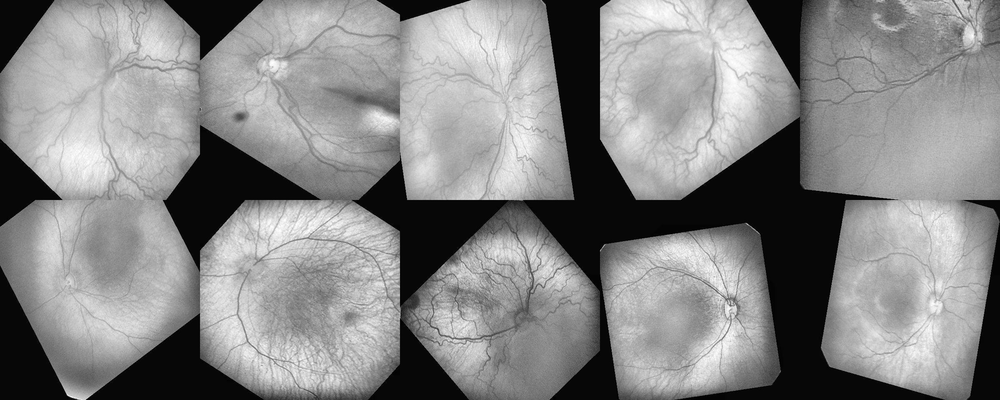

In [81]:
visualize(group_images(raw_train_processed[300:310],5),'raw_img')

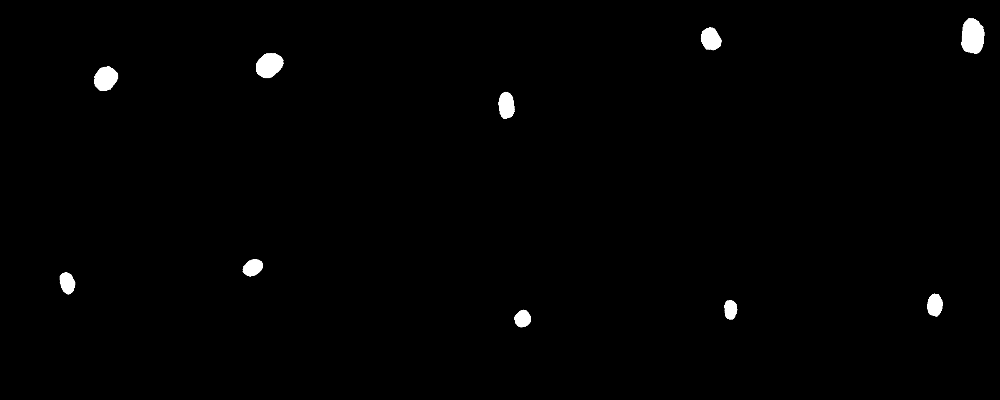

In [82]:
visualize(group_images(mask_train[300:310],5),'raw_img')

In [74]:
img = new_y.swapaxes(1,3)
visualize(group_images(img[0:10],5),'raw_img')

AssertionError: 

In [5]:
raw_img = load_hdf5("DISC/total_raw.hdf5")
mask_img = load_hdf5("DISC/total_mask.hdf5")

raw_train, raw_test, mask_train, mask_test = train_test_split(raw_img, mask_img, test_size = 0.2, random_state = 123)

raw_train = raw_train[:,:,:,80:560]
mask_train = mask_train[:,:,:,80:560]
raw_test = raw_test[:,:,:,80:560]
mask_test = mask_test[:,:,:,80:560]

patches_imgs_train = raw_train
patches_masks_train = mask_train

X = raw_train
y = mask_train
X = X.swapaxes(1,3)
y = y.swapaxes(1,3)


train_idx_cv, test_idx_cv = [], []

for _train_idx, _test_idx in KFold(len(X), n_folds=5, random_state=1):
    print(_train_idx, _test_idx)
    train_idx_cv.append(_train_idx)
    test_idx_cv.append(_test_idx)


train_idx = train_idx_cv[0]
test_idx = test_idx_cv[0]

X_valid, Y_valid = data_generator(X, y, train_or_test='test', batch_size=100, stationary=True).next()


NameError: name 'KFold' is not defined

In [300]:
X_valid, Y_valid = data_generator(X, y, train_or_test='test', batch_size=100, stationary=True).next()

In [305]:
dice(batch[1],batch[1])

<tf.Tensor 'Mean:0' shape=() dtype=float64>

In [306]:
batch[1].shape

(1, 1, 480, 480)

In [307]:
K.clip(K.batch_flatten(batch[1]), 0., 1.)

<tf.Tensor 'clip_by_value_2:0' shape=(?, ?) dtype=float64>

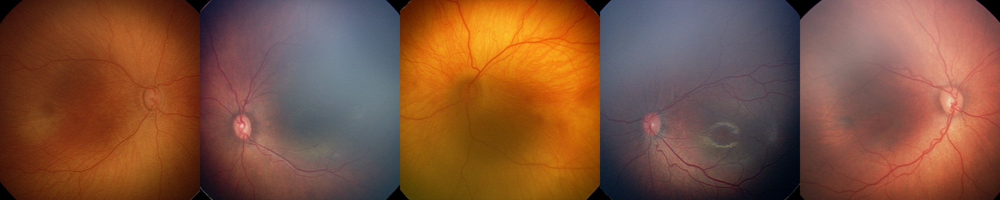

In [302]:
img = X.swapaxes(1,3)
visualize(group_images(img[0:5],5),'raw_img')

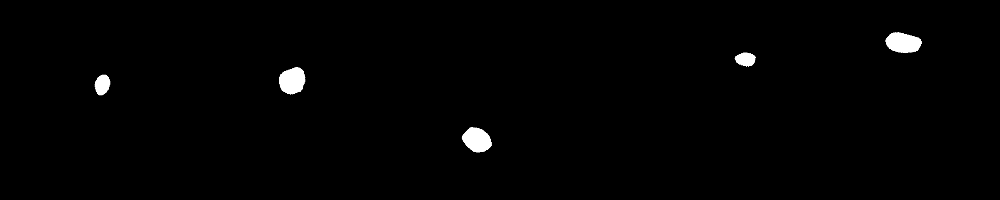

In [274]:
#img = batch_y.swapaxes(1,3)
img = batch_y
visualize(group_images(img[0:5],5),'raw_img')

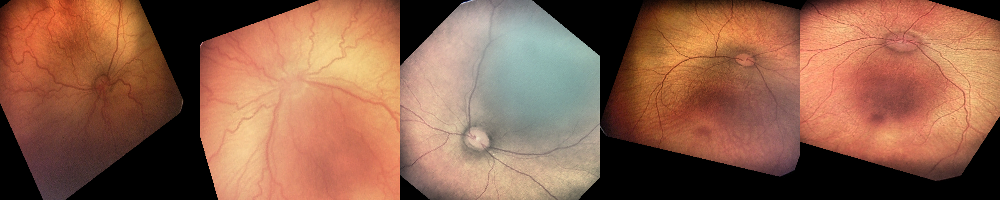

In [304]:
#img = batch_X.swapaxes(1,3)
img = batch_X
visualize(group_images(img[0:5],5),'raw_img')


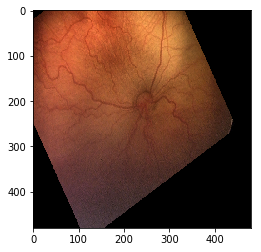

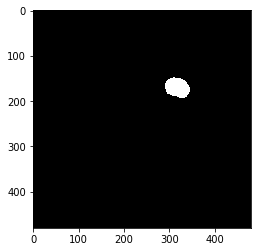

In [244]:
img = batch_X
fig = plt.imshow(np.rollaxis(img[0], 0, 3))
#plt.colorbar(mappable=fig)
plt.show()
plt.imshow(batch[1][0][0], cmap=plt.cm.Greys_r); plt.show()

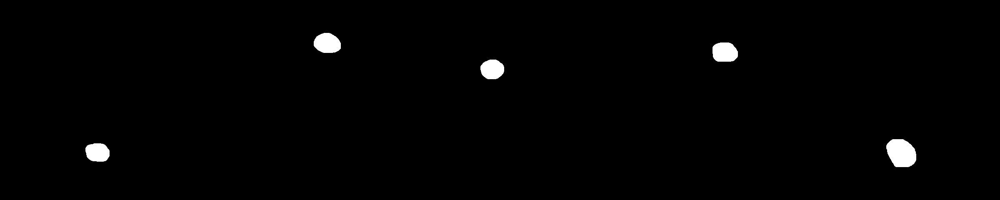

In [259]:
visualize(group_images(Y_valid[0:5,:,:,:],5),'raw_img')


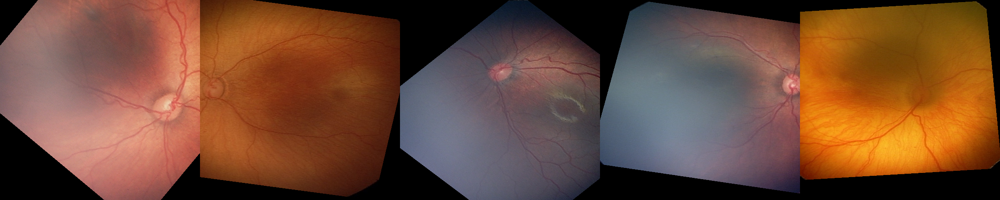

In [50]:
x = t[0].swapaxes(1,3)
visualize(group_images(x,5),'raw_img')


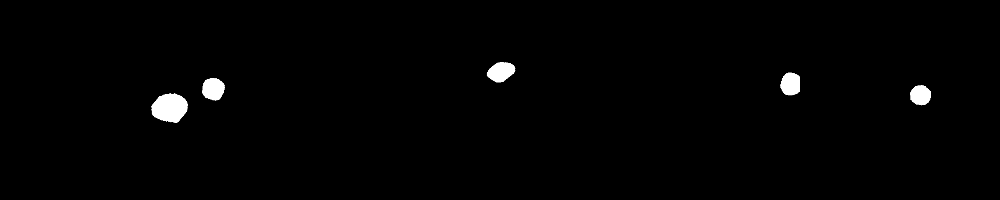

In [51]:
x = t[1].swapaxes(1,3)
visualize(group_images(x,5),'raw_img')


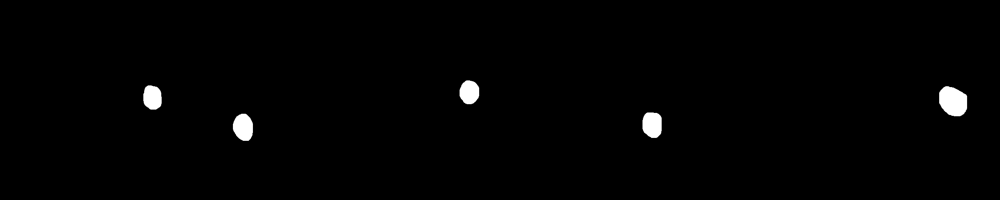

In [5]:
# Take a look at the image
visualize(group_images(raw_train[0:5,:,:,:],5),'raw_img')
visualize(group_images(mask_train[0:5,:,:,:],5),'mask_img')


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

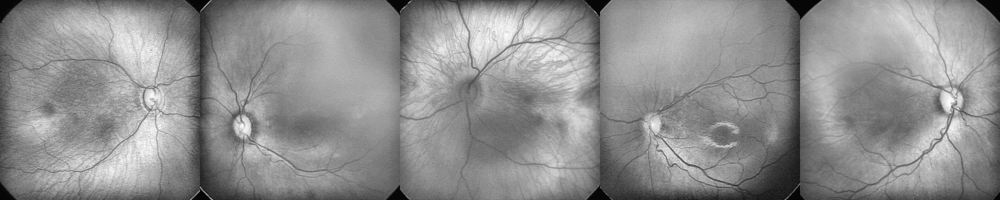

In [6]:
# Preprocessing
raw_train_processed = my_PreProc(raw_train)
visualize(group_images(raw_train_processed[0:5,:,:,:],5),'raw_img')


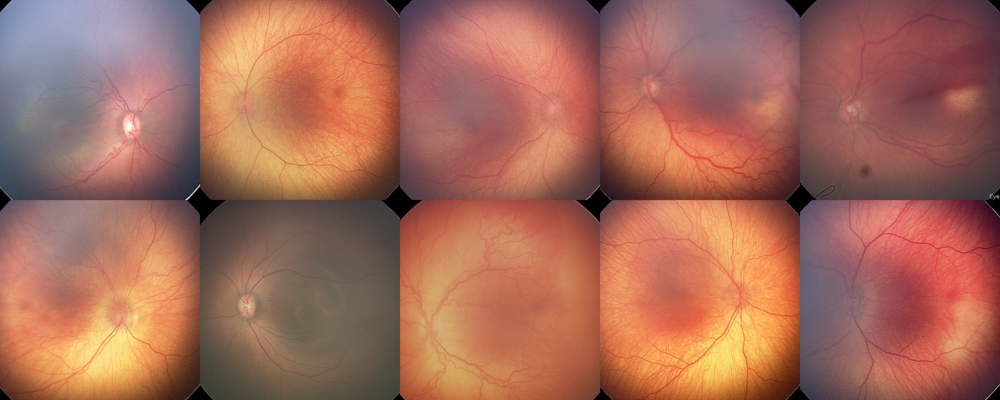

In [26]:
visualize(group_images(raw_train_trim[10:20,:,:,:],5),'raw_img')


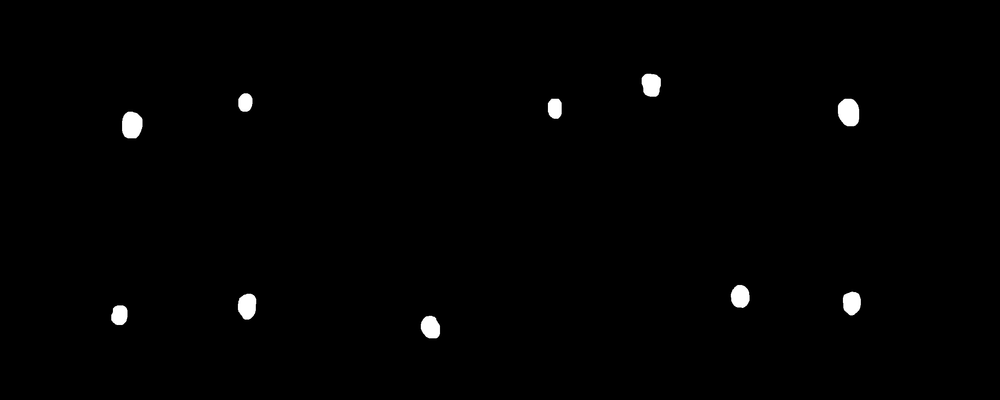

In [25]:
visualize(group_images(mask_train_trim[10:20,:,:,:],5),'mask_img')

# Define the Input patches

In [15]:
# Parameters
patch_height = 80
patch_width = 80
N_subimgs = 74*100
inside_FOV = True
to_extract_patches = True

if to_extract_patches = True:
    patches_imgs_train, patches_masks_train = extract_random_with_disc(raw_train_processed,
                                                                   mask_train,
                                                                   patch_height,
                                                                   patch_width,
                                                                   N_subimgs,
                                                                   inside_FOV)
else:
    patches_imgs_train = raw_train_processed
    patches_masks_train = mask_train
    

                

patches per full image: 100


In [61]:
name_experiment = "testdirectory"

In [63]:
if not os.path.exists(directory):
    os.makedirs(directory)

In [1]:

visualize(group_images(patches_masks_train[20:40,:,:,:],5),'raw_img')


NameError: name 'visualize' is not defined

In [20]:
#=========== Construct and save the model arcitecture =====
n_ch = patches_imgs_train.shape[1]
patch_height = patches_imgs_train.shape[2]
patch_width = patches_imgs_train.shape[3]
model = get_unet(n_ch, patch_height, patch_width)  #the U-net model
print "Check: final output of the network:"
print model.output_shape
#plot(model, to_file='./'+name_experiment+'/'+name_experiment + '_model.png')   #check how the model looks like
json_string = model.to_json()
open('./'+name_experiment+'/'+name_experiment +'_architecture.json', 'w').write(json_string)
model.summary()

Check: final output of the network:
(None, 307200, 2)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 1, 480, 640)  0                                            
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 32, 480, 640) 320         input_4[0][0]                    
__________________________________________________________________________________________________
dropout_16 (Dropout)            (None, 32, 480, 640) 0           conv2d_34[0][0]                  
__________________________________________________________________________________________________
conv2d_35 (Conv2D)              (None, 32, 480, 640) 9248        dropout_16[0][0]                 
_______________________________________________________

In [63]:
class_weight = {0:1.,1:50.}

In [ ]:
#============  Training ==================================
checkpointer = ModelCheckpoint(filepath='./'+name_experiment+'/'+name_experiment +'_best_weights.h5', verbose=1, monitor='val_loss', mode='auto', save_best_only=True) #save at each epoch if the validation decreased


# def step_decay(epoch):
#     lrate = 0.01 #the initial learning rate (by default in keras)
#     if epoch==100:
#         return 0.005
#     else:
#         return lrate
#
# lrate_drop = LearningRateScheduler(step_decay)

patches_masks_train = masks_Unet(patches_masks_train)  #reduce memory consumption
model.fit(patches_imgs_train, patches_masks_train, nb_epoch=N_epochs, batch_size=batch_size, verbose=2, shuffle=True, validation_split=0.1, callbacks=[checkpointer])


#========== Save and test the last model ===================
model.save_weights('./'+name_experiment+'/'+name_experiment +'_last_weights.h5', overwrite=True)
#test the model
# score = model.evaluate(patches_imgs_test, masks_Unet(patches_masks_test), verbose=0)
# print('Test score:', score[0])
# print('Test accuracy:', score[1])

/home/sh402/retina-unet/rop_env_cpu/lib/python2.7/site-packages/ipykernel_launcher.py:15: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  from ipykernel import kernelapp as app


Train on 66 samples, validate on 8 samples
Epoch 1/10


In [ ]:
patches_imgs_test = None
new_height = None
new_width = None
masks_test  = None
patches_masks_test = None
if average_mode == True:
    patches_imgs_test, new_height, new_width, masks_test = get_data_testing_overlap(
        DRIVE_test_imgs_original = DRIVE_test_imgs_original,  #original
        DRIVE_test_groudTruth = path_data + config.get('data paths', 'test_groundTruth'),  #masks
        Imgs_to_test = int(config.get('testing settings', 'full_images_to_test')),
        patch_height = patch_height,
        patch_width = patch_width,
        stride_height = stride_height,
        stride_width = stride_width
    )
else:
    patches_imgs_test, patches_masks_test = get_data_testing(
        DRIVE_test_imgs_original = DRIVE_test_imgs_original,  #original
        DRIVE_test_groudTruth = path_data + config.get('data paths', 'test_groundTruth'),  #masks
        Imgs_to_test = int(config.get('testing settings', 'full_images_to_test')),
        patch_height = patch_height,
        patch_width = patch_width,
    )

(3120, 2304, 2)

In [8]:
best_last = config.get('testing settings', 'best_last')
#Load the saved model
model = model_from_json(open(path_experiment+name_experiment +'_architecture.json').read())
model.load_weights(path_experiment+name_experiment + '_'+best_last+'_weights.h5')
#Calculate the predictions
predictions = model.predict(patches_imgs_test, batch_size=32, verbose=2)
print "predicted images size :"
print predictions.shape

#===== Convert the prediction arrays in corresponding images
pred_patches = pred_to_imgs(predictions, patch_height, patch_width, "original")

predicted images size :
(3120, 2304, 2)


In [9]:
pred_imgs = None
orig_imgs = None
gtruth_masks = None
if average_mode == True:
    pred_imgs = recompone_overlap(pred_patches, new_height, new_width, stride_height, stride_width)# predictions
    orig_imgs = my_PreProc(test_imgs_orig[0:pred_imgs.shape[0],:,:,:])    #originals
    gtruth_masks = masks_test  #ground truth masks
else:
    pred_imgs = recompone(pred_patches,13,12)       # predictions
    orig_imgs = recompone(patches_imgs_test,13,12)  # originals
    gtruth_masks = recompone(patches_masks_test,13,12)  #masks
# apply the DRIVE masks on the repdictions #set everything outside the FOV to zero!!
kill_border(pred_imgs, test_border_masks)  #DRIVE MASK  #only for visualization
## back to original dimensions
orig_imgs = orig_imgs[:,:,0:full_img_height,0:full_img_width]
pred_imgs = pred_imgs[:,:,0:full_img_height,0:full_img_width]
gtruth_masks = gtruth_masks[:,:,0:full_img_height,0:full_img_width]
print "Orig imgs shape: " +str(orig_imgs.shape)
print "pred imgs shape: " +str(pred_imgs.shape)
print "Gtruth imgs shape: " +str(gtruth_masks.shape)
visualize(group_images(orig_imgs,N_visual),path_experiment+"all_originals")#.show()
visualize(group_images(pred_imgs,N_visual),path_experiment+"all_predictions")#.show()
visualize(group_images(gtruth_masks,N_visual),path_experiment+"all_groundTruths")#.show()
#visualize results comparing mask and prediction:
assert (orig_imgs.shape[0]==pred_imgs.shape[0] and orig_imgs.shape[0]==gtruth_masks.shape[0])
N_predicted = orig_imgs.shape[0]
group = N_visual
assert (N_predicted%group==0)
for i in range(int(N_predicted/group)):
    orig_stripe = group_images(orig_imgs[i*group:(i*group)+group,:,:,:],group)
    masks_stripe = group_images(gtruth_masks[i*group:(i*group)+group,:,:,:],group)
    pred_stripe = group_images(pred_imgs[i*group:(i*group)+group,:,:,:],group)
    total_img = np.concatenate((orig_stripe,masks_stripe,pred_stripe),axis=0)
    visualize(total_img,path_experiment+name_experiment +"_Original_GroundTruth_Prediction"+str(i))#.show()


Orig imgs shape: (20, 1, 584, 565)
pred imgs shape: (20, 1, 584, 565)
Gtruth imgs shape: (20, 1, 584, 565)


In [23]:
help(group_images)

Help on function group_images in module help_functions:

group_images(data, per_row)
    #group a set of images row per columns





========  Evaluate the results =======================
Calculating results only inside the FOV:
y scores pixels: 4538143 (radius 270: 270*270*3.14==228906), including background around retina: 6599200 (584*565==329960)
y true pixels: 4538143 (radius 270: 270*270*3.14==228906), including background around retina: 6599200 (584*565==329960)

Area under the ROC curve: 0.9737837211183208

Area under Precision-Recall curve: 0.8957376060963892

Confusion matrix:  Costum threshold (for positive) of 0.5
[[3884749   75745]
 [ 137006  440643]]
Global Accuracy: 0.953119370632
Specificity: 0.98087486056
Sensitivity: 0.762821367301
Precision: 0.853317660364

Jaccard similarity score: 0.9531193706324371

F1 score (F-measure): 0.8055358273988905


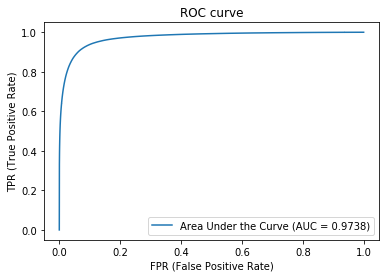

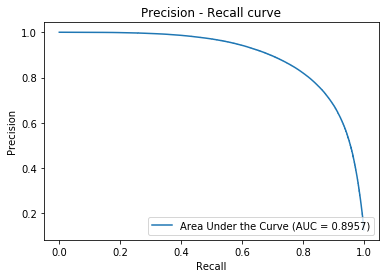

In [10]:
print "\n\n========  Evaluate the results ======================="
#predictions only inside the FOV
y_scores, y_true = pred_only_FOV(pred_imgs,gtruth_masks, test_border_masks)  #returns data only inside the FOV
print "Calculating results only inside the FOV:"
print "y scores pixels: " +str(y_scores.shape[0]) +" (radius 270: 270*270*3.14==228906), including background around retina: " +str(pred_imgs.shape[0]*pred_imgs.shape[2]*pred_imgs.shape[3]) +" (584*565==329960)"
print "y true pixels: " +str(y_true.shape[0]) +" (radius 270: 270*270*3.14==228906), including background around retina: " +str(gtruth_masks.shape[2]*gtruth_masks.shape[3]*gtruth_masks.shape[0])+" (584*565==329960)"

#Area under the ROC curve
fpr, tpr, thresholds = roc_curve((y_true), y_scores)
AUC_ROC = roc_auc_score(y_true, y_scores)
# test_integral = np.trapz(tpr,fpr) #trapz is numpy integration
print "\nArea under the ROC curve: " +str(AUC_ROC)
roc_curve =plt.figure()
plt.plot(fpr,tpr,'-',label='Area Under the Curve (AUC = %0.4f)' % AUC_ROC)
plt.title('ROC curve')
plt.xlabel("FPR (False Positive Rate)")
plt.ylabel("TPR (True Positive Rate)")
plt.legend(loc="lower right")
plt.savefig(path_experiment+"ROC.png")

#Precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
precision = np.fliplr([precision])[0]  #so the array is increasing (you won't get negative AUC)
recall = np.fliplr([recall])[0]  #so the array is increasing (you won't get negative AUC)
AUC_prec_rec = np.trapz(precision,recall)
print "\nArea under Precision-Recall curve: " +str(AUC_prec_rec)
prec_rec_curve = plt.figure()
plt.plot(recall,precision,'-',label='Area Under the Curve (AUC = %0.4f)' % AUC_prec_rec)
plt.title('Precision - Recall curve')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc="lower right")
plt.savefig(path_experiment+"Precision_recall.png")

#Confusion matrix
threshold_confusion = 0.5
print "\nConfusion matrix:  Costum threshold (for positive) of " +str(threshold_confusion)
y_pred = np.empty((y_scores.shape[0]))
for i in range(y_scores.shape[0]):
    if y_scores[i]>=threshold_confusion:
        y_pred[i]=1
    else:
        y_pred[i]=0
confusion = confusion_matrix(y_true, y_pred)
print confusion
accuracy = 0
if float(np.sum(confusion))!=0:
    accuracy = float(confusion[0,0]+confusion[1,1])/float(np.sum(confusion))
print "Global Accuracy: " +str(accuracy)
specificity = 0
if float(confusion[0,0]+confusion[0,1])!=0:
    specificity = float(confusion[0,0])/float(confusion[0,0]+confusion[0,1])
print "Specificity: " +str(specificity)
sensitivity = 0
if float(confusion[1,1]+confusion[1,0])!=0:
    sensitivity = float(confusion[1,1])/float(confusion[1,1]+confusion[1,0])
print "Sensitivity: " +str(sensitivity)
precision = 0
if float(confusion[1,1]+confusion[0,1])!=0:
    precision = float(confusion[1,1])/float(confusion[1,1]+confusion[0,1])
print "Precision: " +str(precision)

#Jaccard similarity index
jaccard_index = jaccard_similarity_score(y_true, y_pred, normalize=True)
print "\nJaccard similarity score: " +str(jaccard_index)

#F1 score
F1_score = f1_score(y_true, y_pred, labels=None, average='binary', sample_weight=None)
print "\nF1 score (F-measure): " +str(F1_score)

#Save the results
file_perf = open(path_experiment+'performances.txt', 'w')
file_perf.write("Area under the ROC curve: "+str(AUC_ROC)
                + "\nArea under Precision-Recall curve: " +str(AUC_prec_rec)
                + "\nJaccard similarity score: " +str(jaccard_index)
                + "\nF1 score (F-measure): " +str(F1_score)
                +"\n\nConfusion matrix:"
                +str(confusion)
                +"\nACCURACY: " +str(accuracy)
                +"\nSENSITIVITY: " +str(sensitivity)
                +"\nSPECIFICITY: " +str(specificity)
                +"\nPRECISION: " +str(precision)
                )
file_perf.close()